<a href="https://colab.research.google.com/github/ckurtz/teaching_UPC_UFRMI/blob/main/CLIP_tutorial_(with_medical_images_ROCO).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Interacting with CLIP

This is a self-contained notebook that shows how to download and run CLIP models, calculate the similarity between arbitrary image and text inputs, and perform zero-shot image classifications.

# Preparation for Colab

Make sure you're running a GPU runtime; if not, select "GPU" as the hardware accelerator in Runtime > Change Runtime Type in the menu. The next cells will install the `clip` package and its dependencies, and check if PyTorch 1.7.1 or later is installed.

In [5]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 kB 2.2 MB/s eta 0:00:00
  Attempting uninstall: wcwidth
    Found existing installation: wcwidth 0.2.10
    Uninstalling wcwidth-0.2.10:
      Successfully uninstalled wcwidth-0.2.10


  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-ow537xv1
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-ow537xv1
  Resolved https://github.com/openai/CLIP.git to commit a1d071733d7111c9c014f024669f959182114e33
  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369500 sha256=a30525f19a5d32b03508ffb2eabfd38c89964748f4271a2c4d9b40e7e1673abe
  Stored in directory: /tmp/pip-ephem-wheel-cache-vackmpcu/wheels/da/2b/4c/d6691fa9597aac8bb85d2ac13b112deb897d5b50f5ad9a37e4
Successfully built clip


# Loading the model

`clip.available_models()` will list the names of available CLIP models.

In [6]:
import clip
import numpy as np

available_models = clip.available_models()
available_models

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In [7]:
import numpy as np
import clip

# Load models and preprocessors
model_VITB16, preprocess_VITB16 = clip.load("ViT-B/16")
model_RN50, preprocess_RN50 = clip.load("RN50")
model_RN101, preprocess_RN101 = clip.load("RN101")
model_RN50x4, preprocess_RN50x4 = clip.load("RN50x4")
model_RN50x16, preprocess_RN50x16 = clip.load("RN50x16")
model_RN50x64, preprocess_RN50x64 = clip.load("RN50x64")
model_VITB32, preprocess_VITB32 = clip.load("ViT-B/32")
model_VITL14, preprocess_VITL14 = clip.load("ViT-L/14")
model_VITL14_336px, preprocess_VITL14_336px = clip.load("ViT-L/14@336px")

model_VITB16.cuda().eval()
model_RN50.cuda().eval()
model_RN101.cuda().eval()
model_RN50x4.cuda().eval()
model_RN50x16.cuda().eval()
model_RN50x64.cuda().eval()
model_VITB32.cuda().eval()
model_VITL14.cuda().eval()
model_VITL14_336px.cuda().eval()

# Set up common parameters
input_resolution = model_RN50x16.visual.input_resolution
context_length = model_RN50x16.context_length
vocab_size = model_RN50x16.vocab_size

# Print model information
for model in [model_VITB16, model_RN50, model_RN101, model_RN50x4, model_RN50x16, model_RN50x64, model_VITB32, model_VITL14, model_VITL14_336px]:
    print(f"Model parameters: {np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")

print("Input resolution:", input_resolution)
print("Context length:", context_length)
print("Vocab size:", vocab_size)


100%|███████████████████████████████████████| 335M/335M [00:07<00:00, 44.0MiB/s]
100%|███████████████████████████████████████| 244M/244M [00:06<00:00, 40.7MiB/s]
100%|███████████████████████████████████████| 278M/278M [00:56<00:00, 5.15MiB/s]
100%|███████████████████████████████████████| 402M/402M [00:38<00:00, 11.1MiB/s]
100%|███████████████████████████████████████| 630M/630M [01:29<00:00, 7.39MiB/s]
100%|█████████████████████████████████████| 1.26G/1.26G [02:58<00:00, 7.58MiB/s]
100%|███████████████████████████████████████| 338M/338M [00:07<00:00, 50.4MiB/s]
100%|███████████████████████████████████████| 890M/890M [00:16<00:00, 56.9MiB/s]
100%|███████████████████████████████████████| 891M/891M [00:15<00:00, 60.0MiB/s]


Model parameters: 149,620,737
Model parameters: 102,007,137
Model parameters: 119,688,033
Model parameters: 178,300,601
Model parameters: 290,979,217
Model parameters: 623,258,305
Model parameters: 151,277,313
Model parameters: 427,616,513
Model parameters: 427,944,193
Input resolution: 384
Context length: 77
Vocab size: 49408


In [8]:
models = [
    model_VITB16, model_RN50, model_RN101, model_RN50x4,
    model_RN50x16, model_RN50x64, model_VITB32,
    model_VITL14, model_VITL14_336px
]

preprocesses = [
    preprocess_VITB16, preprocess_RN50, preprocess_RN101,
    preprocess_RN50x4, preprocess_RN50x16, preprocess_RN50x64,
    preprocess_VITB32, preprocess_VITL14, preprocess_VITL14_336px
]

In [ ]:
import numpy as np
import clip

# Load models and preprocessors
model_VITB16, preprocess_VITB16 = clip.load("ViT-B/16")
model_RN50, preprocess_RN50 = clip.load("RN50")
model_RN101, preprocess_RN101 = clip.load("RN101")
model_RN50x4, preprocess_RN50x4 = clip.load("RN50x4")
model_RN50x16, preprocess_RN50x16 = clip.load("RN50x16")
model_RN50x64, preprocess_RN50x64 = clip.load("RN50x64")
model_VITB32, preprocess_VITB32 = clip.load("ViT-B/32")
model_VITL14, preprocess_VITL14 = clip.load("ViT-L/14")
model_VITL14_336px, preprocess_VITL14_336px = clip.load("ViT-L/14@336px")


models = [
    model_VITB16, model_RN50, model_RN101, model_RN50x4,
    model_RN50x16, model_RN50x64, model_VITB32,
    model_VITL14, model_VITL14_336px
]

preprocesses = [
    preprocess_VITB16, preprocess_RN50, preprocess_RN101,
    preprocess_RN50x4, preprocess_RN50x16, preprocess_RN50x64,
    preprocess_VITB32, preprocess_VITL14, preprocess_VITL14_336px
]

model_names = [
    "VITB16", "RN50", "RN101", "RN50x4", "RN50x16", "RN50x64",
    "VITB32", "VITL14", "VITL14_336px"
]

for model in models:
    model.cuda().eval()

# Image Preprocessing

We resize the input images and center-crop them to conform with the image resolution that the model expects. Before doing so, we will normalize the pixel intensity using the dataset mean and standard deviation.

The second return value from `clip.load()` contains a torchvision `Transform` that performs this preprocessing.



In [7]:
preprocess_RN50

Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x79900b21d120>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)

# Text Preprocessing

We use a case-insensitive tokenizer, which can be invoked using `clip.tokenize()`. By default, the outputs are padded to become 77 tokens long, which is what the CLIP models expects.

In [9]:
clip.tokenize("Hello World!")

tensor([[49406,  3306,  1002,   256, 49407,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0]], dtype=torch.int32)

# Setting up input images and texts

We are going to feed 8 example natrural/medical images and their textual descriptions to the model, and compare the similarity between the corresponding features.

The tokenizer is case-insensitive, and we can freely give any suitable textual descriptions.

In [82]:
import os
import skimage
import IPython.display
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from collections import OrderedDict
import torch

%matplotlib inline
%config InlineBackend.figure_format = 'retina'


# to mount google drive
if os.getcwd()=='/content':
    try:
        from google.colab import drive
        base_working_dir = '/content/drive/MyDrive'
        drive.mount('/content/drive')
    except:
        base_working_dir = os.getcwd()
        pass
!mkdir -p drive
!google-drive-ocamlfuse drive
print(base_working_dir)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/bin/bash: line 1: google-drive-ocamlfuse: command not found
/content/drive/MyDrive


In [75]:
# images to use and their textual descriptions
descriptions = {
    "page": "a page of text about segmentation",
    "chelsea": "a facial photo of a tabby cat",
    "astronaut": "a portrait of an astronaut with the American flag",
    "rocket": "a rocket standing on a launchpad",
    "motorcycle_right": "a red motorcycle standing in a garage",
    "camera": "a person looking at a camera on a tripod",
    "horse": "a black-and-white silhouette of a horse",
    "coffee": "a cup of coffee on a saucer"
}

med_descriptions = {
    "ROCO_00002": "CT scan in axial view showing obliteration of the left maxillary sinus",
    "ROCO_00017": "Coronary angiogram demonstrating occluded arteries",
    "ROCO_00028": "T2 weighted MRI image showing foraminal extensions of the cysts",
    "ROCO_00033": "Lytic lesions (arrows) involving the humerus.",
    "ROCO_00050": "Free air beneath the diaphragm at abdominal x-ray film",
    "ROCO_00056": "View of giant cell tumor of thumb metacarpal preoperatively",
    "ROCO_00060": "Transverse view of lung using CT.Leukemic infiltration is seen.",
    "ROCO_00135": "CT scan showing multiple non-communicating cysts in liver and kidney"
}

med_descriptions2 = {
    "ROCO_00060": "Transverse view of lung using CT.Leukemic infiltration is seen.",
    "ROCO_00001": "Axial MRI (coronal view)",
    "ROCO_00059": "Angiography of the internal carotid artery, late arterial phase. (A) – venous drainage of the AVM, (B) – main arterial supplying vessel, arrow – AVM nidus",
    "ROCO_00062": "Case 4: (A) pretreatment radiograph; (B) Root-canal filled showing one canal with a lot of foraminas around the apical area",
    "ROCO_00068":	 "Preintervention MRCP revealing a nine-millimeter stone in the cystic duct (marked with arrow)",
    "ROCO_00073":	 "A postoperative radiograph shows reduction with Rockwood pin application",
    "ROCO_00076"	:"MRI showing complete occlusion of proximal 4 cm of left subclavian artery with retrograde filling via the left vertebral",
    "ROCO_00079"	 :"Barium meal follow through X-ray showed dilatation of the second part of duodenum with compression of the third part"
}

med_descriptions3 = {
    "ROCO_00001": "Axial MRI (coronal view)",
    "ROCO_00506": "Fragmented humeral head stepping over thoracic aorta (black arrow)",
    "ROCO_00569": "MRI findings. The cystic duct was not seen",
    "ROCO_00708": "Other parameters to evaluate airway",
    "ROCO_00031": "CTO of RCA (closure in the 2nd segment)",
    "ROCO_00686": " Computed tomography showing large bilateral adrenal masses",
    "ROCO_00061": "Postoperative decreased size of the cyst",
    "ROCO_00662": "Radiograph of the chest revealing bilateral pleural effusion",
}

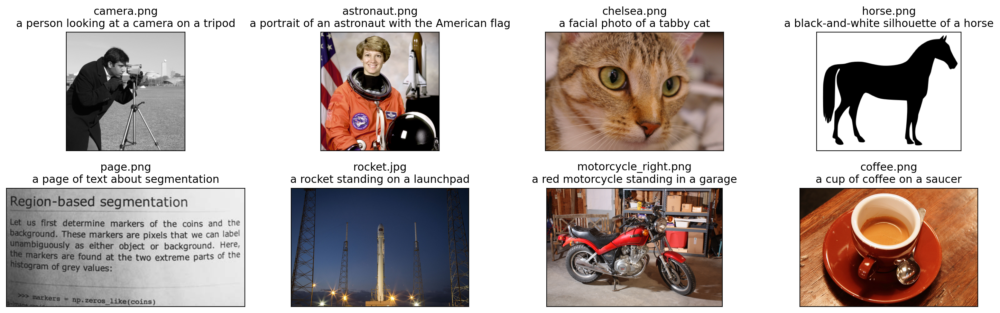

In [12]:
original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

for filename in [filename for filename in os.listdir(skimage.data_dir) if filename.endswith(".png") or filename.endswith(".jpg")]:
    name = os.path.splitext(filename)[0]
    if name not in descriptions:
        continue

    image = Image.open(os.path.join(skimage.data_dir, filename)).convert("RGB")

    plt.subplot(2, 4, len(images) + 1)
    plt.imshow(image)
    plt.title(f"{filename}\n{descriptions[name]}")
    plt.xticks([])
    plt.yticks([])

    original_images.append(image)
    images.append(preprocess_VITB16(image))
    texts.append(descriptions[name])

plt.tight_layout()


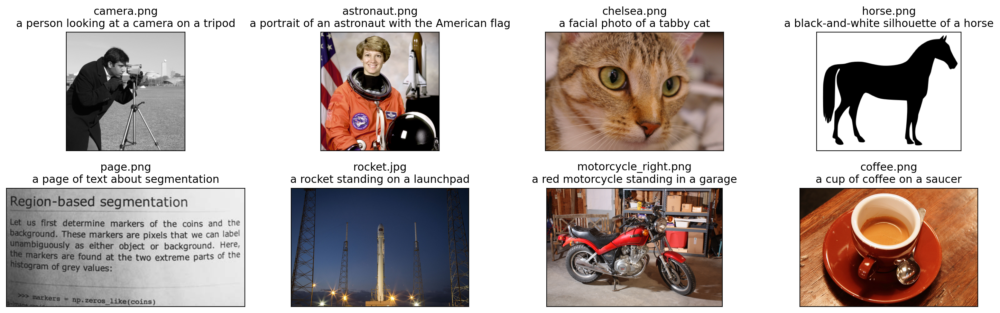

In [13]:
import os
import matplotlib.pyplot as plt
from PIL import Image

original_images = []
image_VITB16 = []
image_RN50 = []
image_RN101 = []
image_RN50x4 = []
image_RN50x16 = []
image_RN50x64 = []
image_VITB32 = []
image_VITL14 = []
image_VITL14_336px = []

texts = []
plt.figure(figsize=(16, 5))

for filename in [filename for filename in os.listdir(skimage.data_dir) if filename.endswith(".png") or filename.endswith(".jpg")]:
    name = os.path.splitext(filename)[0]
    if name not in descriptions:
        continue

    image = Image.open(os.path.join(skimage.data_dir, filename)).convert("RGB")

    plt.subplot(2, 4, len(original_images) + 1)
    plt.imshow(image)
    plt.title(f"{filename}\n{descriptions[name]}")
    plt.xticks([])
    plt.yticks([])

    original_images.append(image)
    image_VITB16.append(preprocess_VITB16(image))
    image_RN50.append(preprocess_RN50(image))
    image_RN101.append(preprocess_RN101(image))
    image_RN50x4.append(preprocess_RN50x4(image))
    image_RN50x16.append(preprocess_RN50x16(image))
    image_RN50x64.append(preprocess_RN50x64(image))
    image_VITB32.append(preprocess_VITB32(image))
    image_VITL14.append(preprocess_VITL14(image))
    image_VITL14_336px.append(preprocess_VITL14_336px(image))

    texts.append(descriptions[name])

plt.tight_layout()


## Building features

We normalize the images, tokenize each text input, and run the forward pass of the model to get the image and text features.

In [14]:
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()

In [15]:
import torch

image_VITB16_input = torch.tensor(np.stack(image_VITB16)).cuda()
image_RN50_input = torch.tensor(np.stack(image_RN50)).cuda()
image_RN101_input = torch.tensor(np.stack(image_RN101)).cuda()
image_RN50x4_input = torch.tensor(np.stack(image_RN50x4)).cuda()
image_RN50x16_input = torch.tensor(np.stack(image_RN50x16)).cuda()
image_RN50x64_input = torch.tensor(np.stack(image_RN50x64)).cuda()
image_VITB32_input = torch.tensor(np.stack(image_VITB32)).cuda()
image_VITL14_input = torch.tensor(np.stack(image_VITL14)).cuda()
image_VITL14_336px_input = torch.tensor(np.stack(image_VITL14_336px)).cuda()

with torch.no_grad():
    image_features_VITB16 = model_VITB16.encode_image(image_VITB16_input).float()
    text_features_VITB16 = model_VITB16.encode_text(text_tokens).float()

    image_features_RN50 = model_RN50.encode_image(image_RN50_input).float()
    text_features_RN50 = model_RN50.encode_text(text_tokens).float()

    image_features_RN101 = model_RN101.encode_image(image_RN101_input).float()
    text_features_RN101 = model_RN101.encode_text(text_tokens).float()

    image_features_RN50x4 = model_RN50x4.encode_image(image_RN50x4_input).float()
    text_features_RN50x4 = model_RN50x4.encode_text(text_tokens).float()

    image_features_RN50x16 = model_RN50x16.encode_image(image_RN50x16_input).float()
    text_features_RN50x16 = model_RN50x16.encode_text(text_tokens).float()

    image_features_RN50x64 = model_RN50x64.encode_image(image_RN50x64_input).float()
    text_features_RN50x64 = model_RN50x64.encode_text(text_tokens).float()

    image_features_VITB32 = model_VITB32.encode_image(image_VITB32_input).float()
    text_features_VITB32 = model_VITB32.encode_text(text_tokens).float()

    image_features_VITL14 = model_VITL14.encode_image(image_VITL14_input).float()
    text_features_VITL14 = model_VITL14.encode_text(text_tokens).float()

    image_features_VITL14_336px = model_VITL14_336px.encode_image(image_VITL14_336px_input).float()
    text_features_VITL14_336px = model_VITL14_336px.encode_text(text_tokens).float()


## Calculating cosine similarity

We normalize the features and calculate the dot product of each pair.

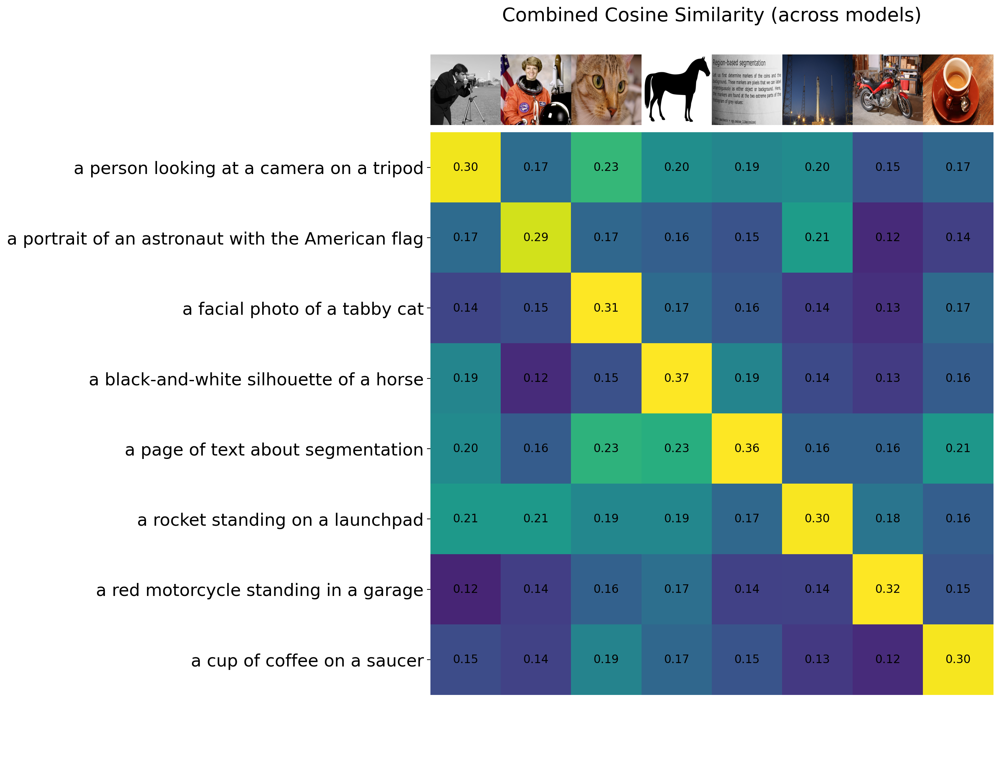

In [16]:
image_features_VITB16 /= image_features_VITB16.norm(dim=-1, keepdim=True)
text_features_VITB16 /= text_features_VITB16.norm(dim=-1, keepdim=True)

image_features_RN50 /= image_features_RN50.norm(dim=-1, keepdim=True)
text_features_RN50 /= text_features_RN50.norm(dim=-1, keepdim=True)

image_features_RN101 /= image_features_RN101.norm(dim=-1, keepdim=True)
text_features_RN101 /= text_features_RN101.norm(dim=-1, keepdim=True)

image_features_RN50x4 /= image_features_RN50x4.norm(dim=-1, keepdim=True)
text_features_RN50x4 /= text_features_RN50x4.norm(dim=-1, keepdim=True)

image_features_RN50x16 /= image_features_RN50x16.norm(dim=-1, keepdim=True)
text_features_RN50x16 /= text_features_RN50x16.norm(dim=-1, keepdim=True)

image_features_RN50x64 /= image_features_RN50x64.norm(dim=-1, keepdim=True)
text_features_RN50x64 /= text_features_RN50x64.norm(dim=-1, keepdim=True)

image_features_VITB32 /= image_features_VITB32.norm(dim=-1, keepdim=True)
text_features_VITB32 /= text_features_VITB32.norm(dim=-1, keepdim=True)

image_features_VITL14 /= image_features_VITL14.norm(dim=-1, keepdim=True)
text_features_VITL14 /= text_features_VITL14.norm(dim=-1, keepdim=True)

image_features_VITL14_336px /= image_features_VITL14_336px.norm(dim=-1, keepdim=True)
text_features_VITL14_336px /= text_features_VITL14_336px.norm(dim=-1, keepdim=True)


similarity_VITB16 = text_features_VITB16.cpu().numpy() @ image_features_VITB16.cpu().numpy().T
similarity_RN50 = text_features_RN50.cpu().numpy() @ image_features_RN50.cpu().numpy().T
similarity_RN101 = text_features_RN101.cpu().numpy() @ image_features_RN101.cpu().numpy().T
similarity_RN50x4 = text_features_RN50x4.cpu().numpy() @ image_features_RN50x4.cpu().numpy().T
similarity_RN50x16 = text_features_RN50x16.cpu().numpy() @ image_features_RN50x16.cpu().numpy().T
similarity_RN50x64 = text_features_RN50x64.cpu().numpy() @ image_features_RN50x64.cpu().numpy().T
similarity_VITB32 = text_features_VITB32.cpu().numpy() @ image_features_VITB32.cpu().numpy().T
similarity_VITL14 = text_features_VITL14.cpu().numpy() @ image_features_VITL14.cpu().numpy().T
similarity_VITL14_336px = text_features_VITL14_336px.cpu().numpy() @ image_features_VITL14_336px.cpu().numpy().T

# Combinaison de toutes les similarités
combined_similarity = (
    similarity_VITB16 +
    similarity_RN50 +
    similarity_RN101 +
    similarity_RN50x4 +
    similarity_RN50x16 +
    similarity_RN50x64 +
    similarity_VITB32 +
    similarity_VITL14 +
    similarity_VITL14_336px
) / 9

count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(combined_similarity, vmin=0.1, vmax=0.3)
# plt.colorbar()
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(combined_similarity.shape[1]):
    for y in range(combined_similarity.shape[0]):
        plt.text(x, y, f"{combined_similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
    plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Combined Cosine Similarity (across models)", size=20)
plt.show()


Text(0.5, 1.0, 'Cosine similarity between text and image features(natural)')

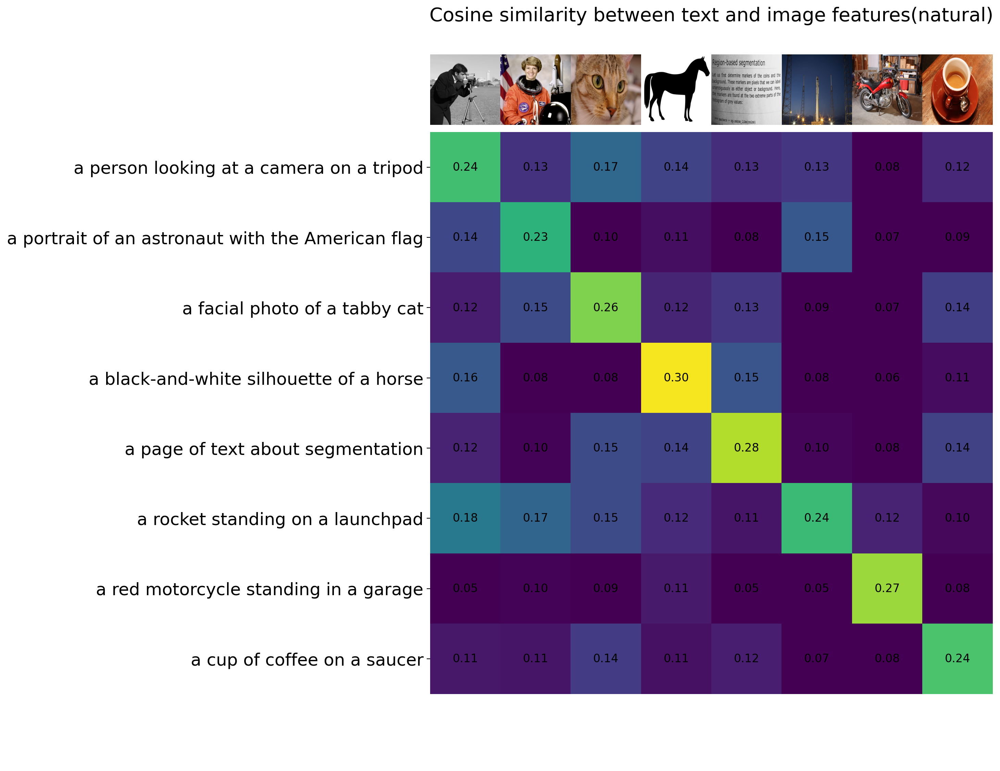

In [15]:
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
# plt.colorbar()
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features(natural)", size=20)

## Performance of CLIP in medical domain

Text(0.5, 1.0, 'Cosine similarity between text and image features(medical)')

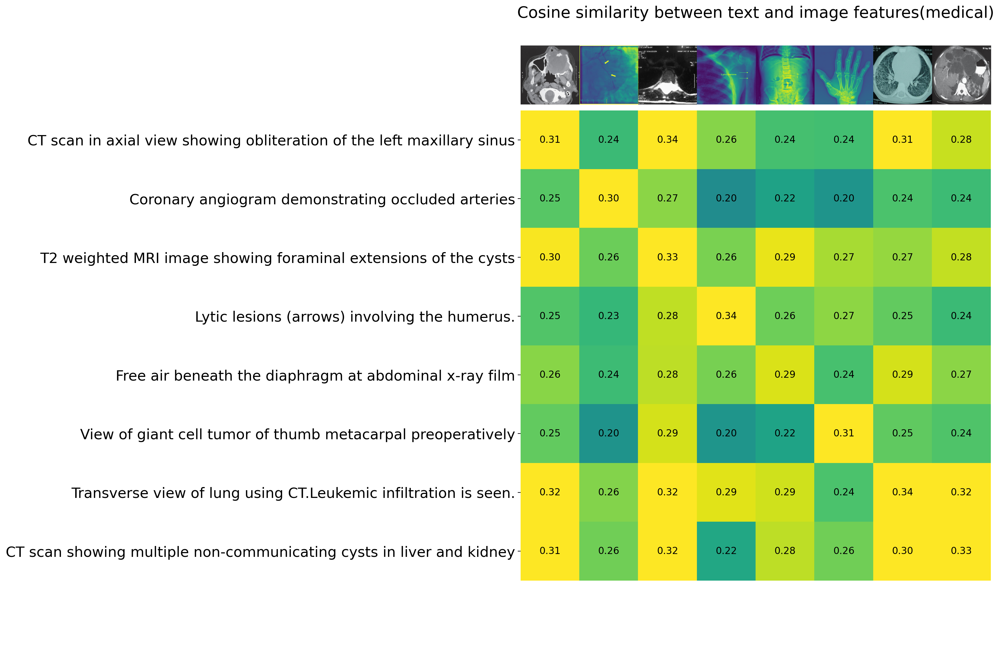

In [72]:
original_images = []
images = []
texts = []
for filename in list(med_descriptions.keys()):
    image = Image.open(os.path.join("/content/drive/MyDrive/data/pretrain_data/roco/train/radiology/images", filename+'.jpg'))
    original_images.append(image)
    images.append(preprocess_VITB16(image))
    texts.append(med_descriptions[filename])
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()
with torch.no_grad():
    image_features = model_VITB16.encode_image(image_input).float()
    text_features = model_VITB16.encode_text(text_tokens).float()
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
# plt.colorbar()
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)
for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features(medical)", size=20)


In [80]:
original_images = []
images = []
texts = []
for filename in list(med_descriptions2.keys()):
    image = Image.open(os.path.join("/content/drive/MyDrive/data/pretrain_data/roco/train/radiology/images", filename+'.jpg'))
    original_images.append(image)
    images.append(preprocess_VITB16(image))
    texts.append(med_descriptions[filename])
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()
with torch.no_grad():
    image_features = model_VITB16.encode_image(image_input).float()
    text_features = model_VITB16.encode_text(text_tokens).float()
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
# plt.colorbar()
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)
for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features(medical)", size=20)


FileNotFoundError: ignored

# Zero-Shot Image Classification

You can classify images using the cosine similarity (times 100) as the logits to the softmax operation.

In [109]:
from torchvision.datasets import CIFAR100
from imagenetv2_pytorch import ImageNetV2Dataset

images = ImageNetV2Dataset(transform=preprocess_VITB16)
cifar100 = CIFAR100(os.path.expanduser("~/.cache"), transform=preprocess_VITB16, download=True)

Files already downloaded and verified


In [110]:
num_images_to_visualize = 8  # Adjust the number of images to visualize as needed

imagescifar = [images for i, (images, labels) in enumerate(cifar100) if i < num_images_to_visualize]


In [ ]:
# Select a subset of images for visualization
num_images_to_visualize = 8
images_fashion_mnist = []

for i, (image, label) in enumerate(fashion_mnist):
    images_fashion_mnist.append(image)

    if i == num_images_to_visualize - 1:
        break

# Encode text and images using CLIP
text_descriptions = [f"This is an image of {fashion_mnist.classes[label]}" for label in range(num_images_to_visualize)]
# text_tokens = processor(text_descriptions, return_tensors="pt", padding=True)
text_tokens = clip.tokenize(text_descriptions).cuda()
image_input = torch.stack(images_fashion_mnist).cuda()

with torch.no_grad():
    text_features = model.encode_text(text_tokens).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)
    # print(image_input.shape)
    image_features = model.encode_image(image_input).float()
    image_features /= image_features.norm(dim=-1, keepdim=True)
text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

In [111]:
text_descriptions = [f"This is an image of {cifar100.classes[label]}" for label in range(num_images_to_visualize)]

text_tokens = clip.tokenize(text_descriptions).cuda()
imagescifar_input = torch.stack(imagescifar).cuda()
with torch.no_grad():
    text_features = model_VITB16.encode_text(text_tokens).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)
    image_features = model_VITB16.encode_image(imagescifar_input).float()
    image_features /= image_features.norm(dim=-1, keepdim=True)

text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

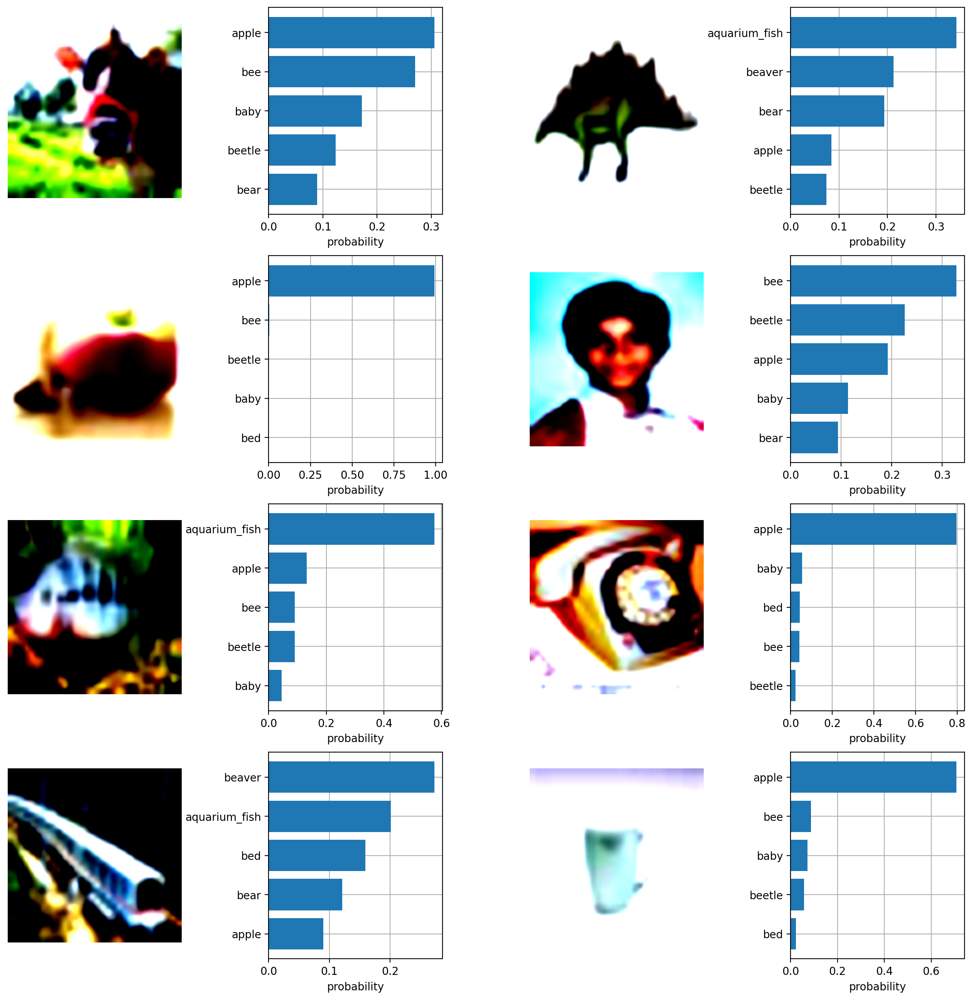

In [112]:
plt.figure(figsize=(16, 16))
# original_imagesc=cifar100
for i, image in enumerate(imagescifar):
    plt.subplot(4, 4, 2 * i + 1)
    plt.imshow(image.permute(1,2,0).numpy())
    plt.axis("off")

    plt.subplot(4, 4, 2 * i + 2)
    y = np.arange(top_probs.shape[-1])
    plt.grid()
    plt.barh(y, top_probs[i])
    plt.gca().invert_yaxis()
    plt.gca().set_axisbelow(True)
    plt.yticks(y, [cifar100.classes[index] for index in top_labels[i].numpy()])
    plt.xlabel("probability")

plt.subplots_adjust(wspace=0.5)
plt.show()

# Fine-tuning CLIP on ROCO



In [46]:
# dataset location
csv_file ="/content/drive/My Drive/data/roco-list.csv"
root_dir = "/content/drive/My Drive/data/pretrain_data/roco/train/radiology/images"
val_csv_file = "/content/drive/My Drive/data/local-val-list.csv"
val_root_dir = "/content/drive/My Drive/data/pretrain_data/roco/val/radiology/images"

# train options
seed = 42
batch_size = 48
image_size = 224
start_epoch = 0
epochs = 1
visual_encoder = "clip@ViT-B/16"
learning_rate = 3e-6
model_path = "/content/drive/My Drive/model_checkpoint_CLIP_ROCO" # set to the directory containing `checkpoint_##.tar`


In [47]:
import os
import numpy as np
import pandas as pd
import torch
import torchvision
import datetime
import time
from tqdm import tqdm
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
from torch.utils.data import Dataset
import random
import clip



class CLRDataset(Dataset):
    """Contrastive Learning Representations Dataset."""

    def __init__(self, csv_file, root_dir, transform=None, clip=False):
        self.clr_frame = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform
        self.clip = clip

    def __len__(self):
        return len(self.clr_frame)

    def text_sampling(self, text):
        text = text.replace("\n", " ")
        text = text.split(".")
        if '' in text:
            text.remove('')
        text = random.choice(text)
        return text

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = os.path.join(self.root_dir,
                                self.clr_frame.iloc[idx, 0]
                                )
        if not os.path.exists(img_name):
            img_name=img_name.replace('train','val')
        image = Image.open(img_name)
        if not self.clip:
            image = image.convert('RGB')
        text = self.clr_frame.iloc[idx, 1]
        name = self.clr_frame.iloc[idx, 0]
        sample = {'image': image, 'text': text,'name':name}
        if self.clip:
            sample = self.transform(sample['image']), sample['text'],sample['name'] #self.text_sampling(sample['text'])
        elif self.transform:
            sample = self.transform(sample)

        return sample


def load_optimizer( model, lr=3e-6):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, epochs, eta_min=0, last_epoch=-1
    )
    return optimizer, scheduler


def train( train_loader, model, tokenizer, optimizer,truncation):
    loss_epoch = 0
    for step, (images, texts,name) in enumerate(train_loader):
        optimizer.zero_grad()
        x_v = images.to('cuda')
        x_u = tokenizer(list(texts), truncate=True).to('cuda')

        v,u=model(x_v,x_u)

        labels = torch.arange(batch_size, dtype=torch.long, device='cuda')

        loss_img = torch.nn.CrossEntropyLoss()
        loss_txt = torch.nn.CrossEntropyLoss()

        img_loss = loss_img(v,labels)
        text_loss = loss_txt(u,labels)

        loss = (img_loss + text_loss)/2

        loss.backward()
        optimizer.step()

        if step % 500 == 0:
            print(f"Step [{step}/{len(train_loader)}]\t Loss: {loss.item()}")

        loss_epoch += loss.item()
    return loss_epoch



def validate( val_loader, model, tokenizer, optimizer, truncation):

    with torch.no_grad():
        model.eval()
        loss_epoch = 0
        for step, (x_v, x_u, _) in enumerate(val_loader):
            x_v = x_v.to('cuda')
            x_u = tokenizer(list(x_u), truncate=True).to('cuda')

            v,u=model(x_v,x_u)

            labels = torch.arange(batch_size, dtype=torch.long, device='cuda')

            loss_img = torch.nn.CrossEntropyLoss()
            loss_txt = torch.nn.CrossEntropyLoss()

            img_loss = loss_img(v,labels)
            text_loss = loss_txt(u,labels)

            loss = (img_loss + text_loss)/2
            loss_epoch += loss.item()

    model.train()
    return loss_epoch


def main(gpu):

    is_master=True

    # set GPU device
    torch.cuda.set_device(gpu)
    torch.manual_seed(seed)
    np.random.seed(seed)

    # initialize model
    print("Initializing model... ", end="", flush=True)
    model, preprocess = clip.load(visual_encoder.split("@")[-1], device='cuda', jit=False)
    model.float()
    tokenizer=clip.tokenize
    train_fonction = train
    validate_fonction = validate

    # optimizer
    optimizer, scheduler = load_optimizer(model, lr=float(learning_rate))

    # initialize dataloader
    transform = preprocess
    print('Image_Transform',transform)
    train_dataset = CLRDataset(csv_file=csv_file,
                               root_dir=root_dir,
                               transform=transform,
                               clip = True
                               )

    val_dataset = CLRDataset(csv_file=val_csv_file,
                             root_dir=val_root_dir,
                             transform=transform,
                             clip = True
                             )

    train_sampler = None
    train_loader = torch.utils.data.DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=(train_sampler is None),
        drop_last=True,
        num_workers=8,
        sampler=train_sampler,
    )

    val_loader = torch.utils.data.DataLoader(
        val_dataset,
        batch_size=batch_size,
        drop_last=True,
        num_workers=8
    )

    print("[DONE]\n")
    print("STARTING TRAINING")
    print('Start Time =', datetime.datetime.now().strftime("%H:%M:%S"), '\n')

    t0 = time.time()
    global_step = 0
    current_epoch = 0
    best_val_loss = np.inf

    for epoch in range(0, epochs):
        if epoch<2:
            if train_sampler is not None:
                train_sampler.set_epoch(epoch)

            lr = optimizer.param_groups[0]["lr"]
            loss_epoch = train_fonction(train_loader, model, tokenizer, optimizer,True)

        if is_master:
            val_loss = validate_fonction( val_loader, model, tokenizer, optimizer, True)
            if val_loss < best_val_loss:
                torch.save(model.state_dict(), os.path.join(model_path, "best_checkpoint.pth"))
                best_val_loss = val_loss

            epoch_counter = epoch - 0
            elapsed = time.time() - t0
            epoch_time = elapsed/(epoch_counter+1)
            remaining = (epochs - (epoch_counter+1))*epoch_time
            remaining = str(datetime.timedelta(seconds=round(remaining)))
            elapsed = str(datetime.timedelta(seconds=round(elapsed)))
            print(f'Epoch {epoch_counter+1}/{epochs} [{elapsed}<{remaining}, {round(epoch_time, 2)}s/epoch] {round((epoch_counter+1)/epochs*100, 1)}% loss: {loss_epoch / len(train_loader)}\t val_loss: {val_loss / len(val_loader)} lr: {lr}')

            current_epoch += 1


if not os.path.exists(model_path):
    os.makedirs(model_path)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Device:", device)
main(0)

Device: cuda:0
Initializing model... 

100%|███████████████████████████████████████| 335M/335M [00:07<00:00, 45.2MiB/s]


Image_Transform Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7c070ba9e0e0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)
[DONE]

STARTING TRAINING
Start Time = 15:36:59 



/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Step [0/1362]	 Loss: 2.5664572715759277


KeyboardInterrupt: ignored

## Performance of CLIP in medical domain(after fine-tuning on ROCO )

In [ ]:
#load checkpoint
model.load_state_dict(torch.load('/content/drive/My Drive/data/ViT-B-16_best_checkpoint_2.tar'))

#compute txt-img similarity again
original_images = []
images = []
texts = []
for filename in list(med_descriptions.keys()):
    image = Image.open(os.path.join(root_dir, filename+'.jpg'))
    original_images.append(image)
    images.append(preprocess(image))
    texts.append(med_descriptions[filename])
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features(medical)", size=20)

#  4. Calculer les performances de CLIP sur une tâche de classification d’images naturelles, sur un autre jeu de données que CIFAR100

In [31]:
imagenet_classes = ["tench", "goldfish", "great white shark", "tiger shark", "hammerhead shark", "electric ray", "stingray", "rooster", "hen", "ostrich", "brambling", "goldfinch", "house finch", "junco", "indigo bunting", "American robin", "bulbul", "jay", "magpie", "chickadee", "American dipper", "kite (bird of prey)", "bald eagle", "vulture", "great grey owl", "fire salamander", "smooth newt", "newt", "spotted salamander", "axolotl", "American bullfrog", "tree frog", "tailed frog", "loggerhead sea turtle", "leatherback sea turtle", "mud turtle", "terrapin", "box turtle", "banded gecko", "green iguana", "Carolina anole", "desert grassland whiptail lizard", "agama", "frilled-necked lizard", "alligator lizard", "Gila monster", "European green lizard", "chameleon", "Komodo dragon", "Nile crocodile", "American alligator", "triceratops", "worm snake", "ring-necked snake", "eastern hog-nosed snake", "smooth green snake", "kingsnake", "garter snake", "water snake", "vine snake", "night snake", "boa constrictor", "African rock python", "Indian cobra", "green mamba", "sea snake", "Saharan horned viper", "eastern diamondback rattlesnake", "sidewinder rattlesnake", "trilobite", "harvestman", "scorpion", "yellow garden spider", "barn spider", "European garden spider", "southern black widow", "tarantula", "wolf spider", "tick", "centipede", "black grouse", "ptarmigan", "ruffed grouse", "prairie grouse", "peafowl", "quail", "partridge", "african grey parrot", "macaw", "sulphur-crested cockatoo", "lorikeet", "coucal", "bee eater", "hornbill", "hummingbird", "jacamar", "toucan", "duck", "red-breasted merganser", "goose", "black swan", "tusker", "echidna", "platypus", "wallaby", "koala", "wombat", "jellyfish", "sea anemone", "brain coral", "flatworm", "nematode", "conch", "snail", "slug", "sea slug", "chiton", "chambered nautilus", "Dungeness crab", "rock crab", "fiddler crab", "red king crab", "American lobster", "spiny lobster", "crayfish", "hermit crab", "isopod", "white stork", "black stork", "spoonbill", "flamingo", "little blue heron", "great egret", "bittern bird", "crane bird", "limpkin", "common gallinule", "American coot", "bustard", "ruddy turnstone", "dunlin", "common redshank", "dowitcher", "oystercatcher", "pelican", "king penguin", "albatross", "grey whale", "killer whale", "dugong", "sea lion", "Chihuahua", "Japanese Chin", "Maltese", "Pekingese", "Shih Tzu", "King Charles Spaniel", "Papillon", "toy terrier", "Rhodesian Ridgeback", "Afghan Hound", "Basset Hound", "Beagle", "Bloodhound", "Bluetick Coonhound", "Black and Tan Coonhound", "Treeing Walker Coonhound", "English foxhound", "Redbone Coonhound", "borzoi", "Irish Wolfhound", "Italian Greyhound", "Whippet", "Ibizan Hound", "Norwegian Elkhound", "Otterhound", "Saluki", "Scottish Deerhound", "Weimaraner", "Staffordshire Bull Terrier", "American Staffordshire Terrier", "Bedlington Terrier", "Border Terrier", "Kerry Blue Terrier", "Irish Terrier", "Norfolk Terrier", "Norwich Terrier", "Yorkshire Terrier", "Wire Fox Terrier", "Lakeland Terrier", "Sealyham Terrier", "Airedale Terrier", "Cairn Terrier", "Australian Terrier", "Dandie Dinmont Terrier", "Boston Terrier", "Miniature Schnauzer", "Giant Schnauzer", "Standard Schnauzer", "Scottish Terrier", "Tibetan Terrier", "Australian Silky Terrier", "Soft-coated Wheaten Terrier", "West Highland White Terrier", "Lhasa Apso", "Flat-Coated Retriever", "Curly-coated Retriever", "Golden Retriever", "Labrador Retriever", "Chesapeake Bay Retriever", "German Shorthaired Pointer", "Vizsla", "English Setter", "Irish Setter", "Gordon Setter", "Brittany dog", "Clumber Spaniel", "English Springer Spaniel", "Welsh Springer Spaniel", "Cocker Spaniel", "Sussex Spaniel", "Irish Water Spaniel", "Kuvasz", "Schipperke", "Groenendael dog", "Malinois", "Briard", "Australian Kelpie", "Komondor", "Old English Sheepdog", "Shetland Sheepdog", "collie", "Border Collie", "Bouvier des Flandres dog", "Rottweiler", "German Shepherd Dog", "Dobermann", "Miniature Pinscher", "Greater Swiss Mountain Dog", "Bernese Mountain Dog", "Appenzeller Sennenhund", "Entlebucher Sennenhund", "Boxer", "Bullmastiff", "Tibetan Mastiff", "French Bulldog", "Great Dane", "St. Bernard", "husky", "Alaskan Malamute", "Siberian Husky", "Dalmatian", "Affenpinscher", "Basenji", "pug", "Leonberger", "Newfoundland dog", "Great Pyrenees dog", "Samoyed", "Pomeranian", "Chow Chow", "Keeshond", "brussels griffon", "Pembroke Welsh Corgi", "Cardigan Welsh Corgi", "Toy Poodle", "Miniature Poodle", "Standard Poodle", "Mexican hairless dog (xoloitzcuintli)", "grey wolf", "Alaskan tundra wolf", "red wolf or maned wolf", "coyote", "dingo", "dhole", "African wild dog", "hyena", "red fox", "kit fox", "Arctic fox", "grey fox", "tabby cat", "tiger cat", "Persian cat", "Siamese cat", "Egyptian Mau", "cougar", "lynx", "leopard", "snow leopard", "jaguar", "lion", "tiger", "cheetah", "brown bear", "American black bear", "polar bear", "sloth bear", "mongoose", "meerkat", "tiger beetle", "ladybug", "ground beetle", "longhorn beetle", "leaf beetle", "dung beetle", "rhinoceros beetle", "weevil", "fly", "bee", "ant", "grasshopper", "cricket insect", "stick insect", "cockroach", "praying mantis", "cicada", "leafhopper", "lacewing", "dragonfly", "damselfly", "red admiral butterfly", "ringlet butterfly", "monarch butterfly", "small white butterfly", "sulphur butterfly", "gossamer-winged butterfly", "starfish", "sea urchin", "sea cucumber", "cottontail rabbit", "hare", "Angora rabbit", "hamster", "porcupine", "fox squirrel", "marmot", "beaver", "guinea pig", "common sorrel horse", "zebra", "pig", "wild boar", "warthog", "hippopotamus", "ox", "water buffalo", "bison", "ram (adult male sheep)", "bighorn sheep", "Alpine ibex", "hartebeest", "impala (antelope)", "gazelle", "arabian camel", "llama", "weasel", "mink", "European polecat", "black-footed ferret", "otter", "skunk", "badger", "armadillo", "three-toed sloth", "orangutan", "gorilla", "chimpanzee", "gibbon", "siamang", "guenon", "patas monkey", "baboon", "macaque", "langur", "black-and-white colobus", "proboscis monkey", "marmoset", "white-headed capuchin", "howler monkey", "titi monkey", "Geoffroy's spider monkey", "common squirrel monkey", "ring-tailed lemur", "indri", "Asian elephant", "African bush elephant", "red panda", "giant panda", "snoek fish", "eel", "silver salmon", "rock beauty fish", "clownfish", "sturgeon", "gar fish", "lionfish", "pufferfish", "abacus", "abaya", "academic gown", "accordion", "acoustic guitar", "aircraft carrier", "airliner", "airship", "altar", "ambulance", "amphibious vehicle", "analog clock", "apiary", "apron", "trash can", "assault rifle", "backpack", "bakery", "balance beam", "balloon", "ballpoint pen", "Band-Aid", "banjo", "baluster / handrail", "barbell", "barber chair", "barbershop", "barn", "barometer", "barrel", "wheelbarrow", "baseball", "basketball", "bassinet", "bassoon", "swimming cap", "bath towel", "bathtub", "station wagon", "lighthouse", "beaker", "military hat (bearskin or shako)", "beer bottle", "beer glass", "bell tower", "baby bib", "tandem bicycle", "bikini", "ring binder", "binoculars", "birdhouse", "boathouse", "bobsleigh", "bolo tie", "poke bonnet", "bookcase", "bookstore", "bottle cap", "hunting bow", "bow tie", "brass memorial plaque", "bra", "breakwater", "breastplate", "broom", "bucket", "buckle", "bulletproof vest", "high-speed train", "butcher shop", "taxicab", "cauldron", "candle", "cannon", "canoe", "can opener", "cardigan", "car mirror", "carousel", "tool kit", "cardboard box / carton", "car wheel", "automated teller machine", "cassette", "cassette player", "castle", "catamaran", "CD player", "cello", "mobile phone", "chain", "chain-link fence", "chain mail", "chainsaw", "storage chest", "chiffonier", "bell or wind chime", "china cabinet", "Christmas stocking", "church", "movie theater", "cleaver", "cliff dwelling", "cloak", "clogs", "cocktail shaker", "coffee mug", "coffeemaker", "spiral or coil", "combination lock", "computer keyboard", "candy store", "container ship", "convertible", "corkscrew", "cornet", "cowboy boot", "cowboy hat", "cradle", "construction crane", "crash helmet", "crate", "infant bed", "Crock Pot", "croquet ball", "crutch", "cuirass", "dam", "desk", "desktop computer", "rotary dial telephone", "diaper", "digital clock", "digital watch", "dining table", "dishcloth", "dishwasher", "disc brake", "dock", "dog sled", "dome", "doormat", "drilling rig", "drum", "drumstick", "dumbbell", "Dutch oven", "electric fan", "electric guitar", "electric locomotive", "entertainment center", "envelope", "espresso machine", "face powder", "feather boa", "filing cabinet", "fireboat", "fire truck", "fire screen", "flagpole", "flute", "folding chair", "football helmet", "forklift", "fountain", "fountain pen", "four-poster bed", "freight car", "French horn", "frying pan", "fur coat", "garbage truck", "gas mask or respirator", "gas pump", "goblet", "go-kart", "golf ball", "golf cart", "gondola", "gong", "gown", "grand piano", "greenhouse", "radiator grille", "grocery store", "guillotine", "hair clip", "hair spray", "half-track", "hammer", "hamper", "hair dryer", "hand-held computer", "handkerchief", "hard disk drive", "harmonica", "harp", "combine harvester", "hatchet", "holster", "home theater", "honeycomb", "hook", "hoop skirt", "gymnastic horizontal bar", "horse-drawn vehicle", "hourglass", "iPod", "clothes iron", "carved pumpkin", "jeans", "jeep", "T-shirt", "jigsaw puzzle", "rickshaw", "joystick", "kimono", "knee pad", "knot", "lab coat", "ladle", "lampshade", "laptop computer", "lawn mower", "lens cap", "letter opener", "library", "lifeboat", "lighter", "limousine", "ocean liner", "lipstick", "slip-on shoe", "lotion", "music speaker", "loupe magnifying glass", "sawmill", "magnetic compass", "messenger bag", "mailbox", "tights", "one-piece bathing suit", "manhole cover", "maraca", "marimba", "mask", "matchstick", "maypole", "maze", "measuring cup", "medicine cabinet", "megalith", "microphone", "microwave oven", "military uniform", "milk can", "minibus", "miniskirt", "minivan", "missile", "mitten", "mixing bowl", "mobile home", "ford model t", "modem", "monastery", "monitor", "moped", "mortar and pestle", "graduation cap", "mosque", "mosquito net", "vespa", "mountain bike", "tent", "computer mouse", "mousetrap", "moving van", "muzzle", "metal nail", "neck brace", "necklace", "baby pacifier", "notebook computer", "obelisk", "oboe", "ocarina", "odometer", "oil filter", "pipe organ", "oscilloscope", "overskirt", "bullock cart", "oxygen mask", "product packet / packaging", "paddle", "paddle wheel", "padlock", "paintbrush", "pajamas", "palace", "pan flute", "paper towel", "parachute", "parallel bars", "park bench", "parking meter", "railroad car", "patio", "payphone", "pedestal", "pencil case", "pencil sharpener", "perfume", "Petri dish", "photocopier", "plectrum", "Pickelhaube", "picket fence", "pickup truck", "pier", "piggy bank", "pill bottle", "pillow", "ping-pong ball", "pinwheel", "pirate ship", "drink pitcher", "block plane", "planetarium", "plastic bag", "plate rack", "farm plow", "plunger", "Polaroid camera", "pole", "police van", "poncho", "pool table", "soda bottle", "plant pot", "potter's wheel", "power drill", "prayer rug", "printer", "prison", "missile", "projector", "hockey puck", "punching bag", "purse", "quill", "quilt", "race car", "racket", "radiator", "radio", "radio telescope", "rain barrel", "recreational vehicle", "fishing casting reel", "reflex camera", "refrigerator", "remote control", "restaurant", "revolver", "rifle", "rocking chair", "rotisserie", "eraser", "rugby ball", "ruler measuring stick", "sneaker", "safe", "safety pin", "salt shaker", "sandal", "sarong", "saxophone", "scabbard", "weighing scale", "school bus", "schooner", "scoreboard", "CRT monitor", "screw", "screwdriver", "seat belt", "sewing machine", "shield", "shoe store", "shoji screen / room divider", "shopping basket", "shopping cart", "shovel", "shower cap", "shower curtain", "ski", "balaclava ski mask", "sleeping bag", "slide rule", "sliding door", "slot machine", "snorkel", "snowmobile", "snowplow", "soap dispenser", "soccer ball", "sock", "solar thermal collector", "sombrero", "soup bowl", "keyboard space bar", "space heater", "space shuttle", "spatula", "motorboat", "spider web", "spindle", "sports car", "spotlight", "stage", "steam locomotive", "through arch bridge", "steel drum", "stethoscope", "scarf", "stone wall", "stopwatch", "stove", "strainer", "tram", "stretcher", "couch", "stupa", "submarine", "suit", "sundial", "sunglasses", "sunglasses", "sunscreen", "suspension bridge", "mop", "sweatshirt", "swim trunks / shorts", "swing", "electrical switch", "syringe", "table lamp", "tank", "tape player", "teapot", "teddy bear", "television", "tennis ball", "thatched roof", "front curtain", "thimble", "threshing machine", "throne", "tile roof", "toaster", "tobacco shop", "toilet seat", "torch", "totem pole", "tow truck", "toy store", "tractor", "semi-trailer truck", "tray", "trench coat", "tricycle", "trimaran", "tripod", "triumphal arch", "trolleybus", "trombone", "hot tub", "turnstile", "typewriter keyboard", "umbrella", "unicycle", "upright piano", "vacuum cleaner", "vase", "vaulted or arched ceiling", "velvet fabric", "vending machine", "vestment", "viaduct", "violin", "volleyball", "waffle iron", "wall clock", "wallet", "wardrobe", "military aircraft", "sink", "washing machine", "water bottle", "water jug", "water tower", "whiskey jug", "whistle", "hair wig", "window screen", "window shade", "Windsor tie", "wine bottle", "airplane wing", "wok", "wooden spoon", "wool", "split-rail fence", "shipwreck", "sailboat", "yurt", "website", "comic book", "crossword", "traffic or street sign", "traffic light", "dust jacket", "menu", "plate", "guacamole", "consomme", "hot pot", "trifle", "ice cream", "popsicle", "baguette", "bagel", "pretzel", "cheeseburger", "hot dog", "mashed potatoes", "cabbage", "broccoli", "cauliflower", "zucchini", "spaghetti squash", "acorn squash", "butternut squash", "cucumber", "artichoke", "bell pepper", "cardoon", "mushroom", "Granny Smith apple", "strawberry", "orange", "lemon", "fig", "pineapple", "banana", "jackfruit", "cherimoya (custard apple)", "pomegranate", "hay", "carbonara", "chocolate syrup", "dough", "meatloaf", "pizza", "pot pie", "burrito", "red wine", "espresso", "tea cup", "eggnog", "mountain", "bubble", "cliff", "coral reef", "geyser", "lakeshore", "promontory", "sandbar", "beach", "valley", "volcano", "baseball player", "bridegroom", "scuba diver", "rapeseed", "daisy", "yellow lady's slipper", "corn", "acorn", "rose hip", "horse chestnut seed", "coral fungus", "agaric", "gyromitra", "stinkhorn mushroom", "earth star fungus", "hen of the woods mushroom", "bolete", "corn cob", "toilet paper"]


In [32]:
imagenet_templates = [
    'a bad photo of a {}.',
    'a photo of many {}.',
    'a sculpture of a {}.',
    'a photo of the hard to see {}.',
    'a low resolution photo of the {}.',
    'a rendering of a {}.',
    'graffiti of a {}.',
    'a bad photo of the {}.',
    'a cropped photo of the {}.',
    'a tattoo of a {}.',
    'the embroidered {}.',
    'a photo of a hard to see {}.',
    'a bright photo of a {}.',
    'a photo of a clean {}.',
    'a photo of a dirty {}.',
    'a dark photo of the {}.',
    'a drawing of a {}.',
    'a photo of my {}.',
    'the plastic {}.',
    'a photo of the cool {}.',
    'a close-up photo of a {}.',
    'a black and white photo of the {}.',
    'a painting of the {}.',
    'a painting of a {}.',
    'a pixelated photo of the {}.',
    'a sculpture of the {}.',
    'a bright photo of the {}.',
    'a cropped photo of a {}.',
    'a plastic {}.',
    'a photo of the dirty {}.',
    'a jpeg corrupted photo of a {}.',
    'a blurry photo of the {}.',
    'a photo of the {}.',
    'a good photo of the {}.',
    'a rendering of the {}.',
    'a {} in a video game.',
    'a photo of one {}.',
    'a doodle of a {}.',
    'a close-up photo of the {}.',
    'a photo of a {}.',
    'the origami {}.',
    'the {} in a video game.',
    'a sketch of a {}.',
    'a doodle of the {}.',
    'a origami {}.',
    'a low resolution photo of a {}.',
    'the toy {}.',
    'a rendition of the {}.',
    'a photo of the clean {}.',
    'a photo of a large {}.',
    'a rendition of a {}.',
    'a photo of a nice {}.',
    'a photo of a weird {}.',
    'a blurry photo of a {}.',
    'a cartoon {}.',
    'art of a {}.',
    'a sketch of the {}.',
    'a embroidered {}.',
    'a pixelated photo of a {}.',
    'itap of the {}.',
    'a jpeg corrupted photo of the {}.',
    'a good photo of a {}.',
    'a plushie {}.',
    'a photo of the nice {}.',
    'a photo of the small {}.',
    'a photo of the weird {}.',
    'the cartoon {}.',
    'art of the {}.',
    'a drawing of the {}.',
    'a photo of the large {}.',
    'a black and white photo of a {}.',
    'the plushie {}.',
    'a dark photo of a {}.',
    'itap of a {}.',
    'graffiti of the {}.',
    'a toy {}.',
    'itap of my {}.',
    'a photo of a cool {}.',
    'a photo of a small {}.',
    'a tattoo of the {}.',
]

print(f"{len(imagenet_classes)} classes, {len(imagenet_templates)} templates")

1000 classes, 80 templates


In [33]:
!pip install git+https://github.com/modestyachts/ImageNetV2_pytorch
from torchvision.datasets import CIFAR100
from imagenetv2_pytorch import ImageNetV2Dataset
import os

cifar100 = CIFAR100(os.path.expanduser("~/.cache"), transform=preprocess_VITB16, download=True)
images = ImageNetV2Dataset(transform=preprocess_RN50)

loader_imagenet = torch.utils.data.DataLoader(images, batch_size=32, num_workers=2)
loader_cifar = torch.utils.data.DataLoader(cifar100, batch_size=32, num_workers=2)

  Cloning https://github.com/modestyachts/ImageNetV2_pytorch to /tmp/pip-req-build-qachvzba
  Running command git clone --filter=blob:none --quiet https://github.com/modestyachts/ImageNetV2_pytorch /tmp/pip-req-build-qachvzba
  Resolved https://github.com/modestyachts/ImageNetV2_pytorch to commit 14d4456c39fe7f02a665544dd9fc37c1a5f8b635
  Preparing metadata (setup.py) ... done


100%|██████████| 169001437/169001437 [00:06<00:00, 28106983.79it/s]


Extracting /root/.cache/cifar-100-python.tar.gz to /root/.cache
Dataset matched-frequency not found on disk, downloading....


100%|██████████| 1.26G/1.26G [00:25<00:00, 48.7MiB/s]


Extracting....


In [49]:
import torch
from tqdm import tqdm
from sklearn.metrics import accuracy_score

def zeroshot_classifier(classnames, templates, model):
    with torch.no_grad():
        zeroshot_weights = []
        for classname in tqdm(classnames):
            texts = [template.format(classname) for template in templates] #format with class
            texts = clip.tokenize(texts).cuda() #tokenize
            class_embeddings = model.encode_text(texts) #embed with text encoder
            class_embeddings /= class_embeddings.norm(dim=-1, keepdim=True)
            class_embedding = class_embeddings.mean(dim=0)
            class_embedding /= class_embedding.norm()
            zeroshot_weights.append(class_embedding)
        zeroshot_weights = torch.stack(zeroshot_weights, dim=1).cuda()
    return zeroshot_weights

def calculate_accuracy(output, target, topk=(1,)):
    pred = output.topk(max(topk), 1, True, True)[1].t()
    correct = pred.eq(target.view(1, -1).expand_as(pred))
    return [float(correct[:k].reshape(-1).float().sum(0, keepdim=True).cpu().numpy()) for k in topk]

def evaluate_model(loader, model, zeroshot_weights):
    model.eval()
    top1, top5, n = 0., 0., 0.
    all_true_labels = []
    all_top_labels = []

    with torch.no_grad():
        for i, (images, target) in enumerate(tqdm(loader, desc="Evaluating", unit="batch")):
            images = images.cuda()
            target = target.cuda()

            # predict
            image_features = model.encode_image(images)
            image_features /= image_features.norm(dim=-1, keepdim=True)
            logits = 100. * image_features @ zeroshot_weights

            # measure accuracy
            acc1, acc5 = calculate_accuracy(logits, target, topk=(1, 5))
            top1 += acc1
            top5 += acc5
            n += images.size(0)

    top1_accuracy = (top1 / n) * 100
    top5_accuracy = (top5 / n) * 100

    accuracy_value = accuracy_score(all_true_labels, all_top_labels) * 100

    print(f"\nTop-1 accuracy: {top1_accuracy:.2f}")
    print(f"Top-5 accuracy: {top5_accuracy:.2f}")
    return top1_accuracy, top5_accuracy


In [51]:
models = [
    model_VITB16, model_RN50, model_RN101
]
accuracy = []
for model in models:
    zeroshot = zeroshot_classifier(imagenet_classes, imagenet_templates, model)
    accuracy.append(evaluate_model(loader_imagenet, model, zeroshot))

Evaluating: 100%|██████████| 313/313 [01:26<00:00,  3.61batch/s]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



Top-1 accuracy: 61.92
Top-5 accuracy: 87.36


Evaluating: 100%|██████████| 313/313 [01:21<00:00,  3.84batch/s]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



Top-1 accuracy: 52.91
Top-5 accuracy: 81.48


Evaluating: 100%|██████████| 313/313 [01:23<00:00,  3.77batch/s]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



Top-1 accuracy: 56.21
Top-5 accuracy: 83.19


Evaluating:   0%|          | 0/313 [00:01<?, ?batch/s]


RuntimeError: ignored

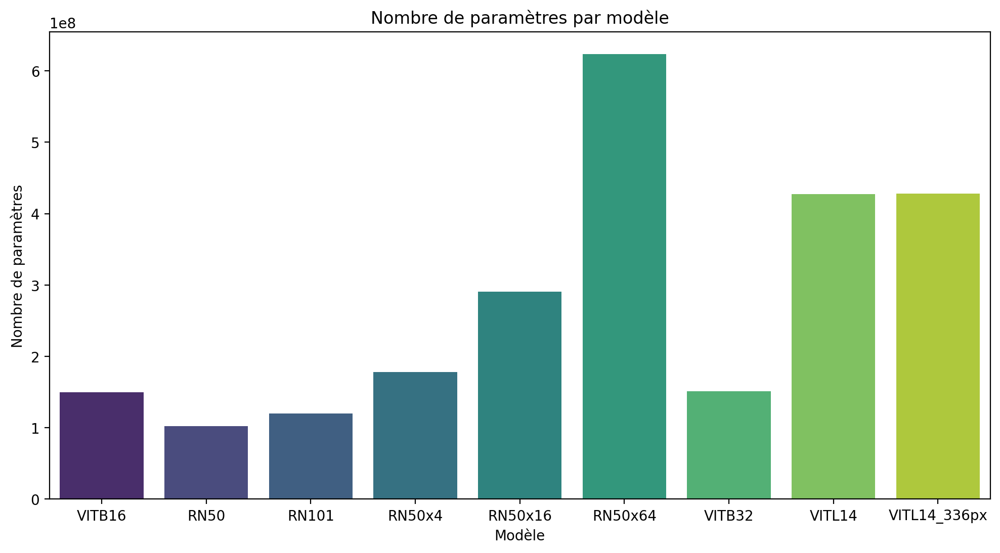

In [61]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

model_names = [
    "VITB16", "RN50", "RN101", "RN50x4", "RN50x16", "RN50x64",
    "VITB32", "VITL14", "VITL14_336px"
]

params_numbers = [
    149620737, 102007137, 119688033, 178300601, 290979217,
    623258305, 151277313, 427616513, 427944193
]
df_params = pd.DataFrame({"Model": model_names, "Parameters": params_numbers})

plt.figure(figsize=(12, 6))
sns.barplot(x="Model", y="Parameters", data=df_params, palette="viridis")
plt.xlabel("Modèle")
plt.ylabel("Nombre de paramètres")
plt.title("Nombre de paramètres par modèle")

plt.show()


In [66]:
accuracy

[(61.919999999999995, 87.36),
 (52.910000000000004, 81.47999999999999),
 (56.21000000000001, 83.19)]

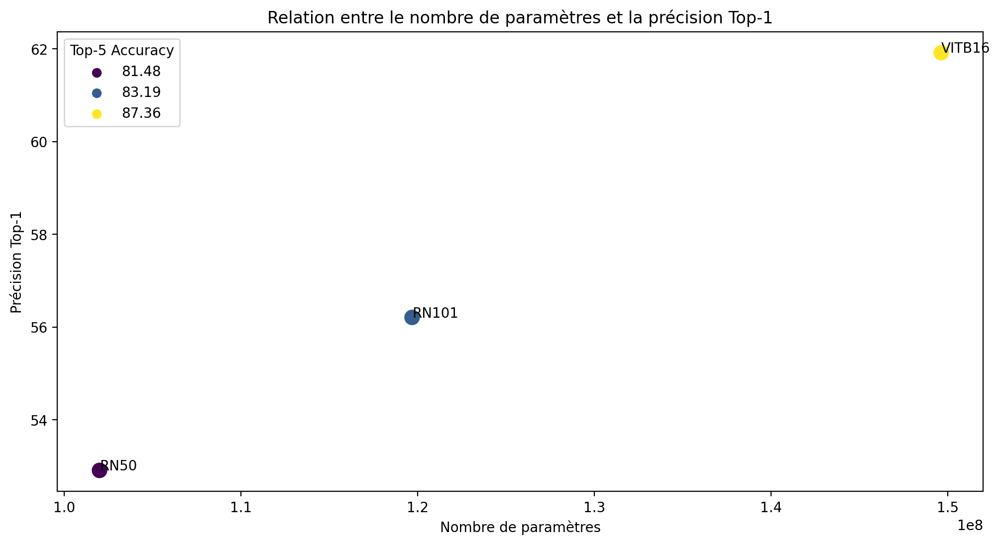

In [68]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Exemple de données
accuracy_data = [
    (61.92, 87.36, "VITB16"),
    (52.91, 81.48, "RN50"),
    (56.21, 83.19, "RN101")
]

params_number_data = [
    149620737,
    102007137,
    119688033
]

# Création du DataFrame pour la précision
df_accuracy = pd.DataFrame(accuracy_data, columns=["Top-1 Accuracy", "Top-5 Accuracy", "Model"])

# Ajout de la colonne pour le nombre de paramètres
df_accuracy["Parameters"] = params_number_data

# Création du graphique seaborn
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df_accuracy, x="Parameters", y="Top-1 Accuracy", hue="Top-5 Accuracy", palette="viridis", s=150)
plt.xlabel("Nombre de paramètres")
plt.ylabel("Précision Top-1")
plt.title("Relation entre le nombre de paramètres et la précision Top-1")

# Ajout du nom du modèle à chaque point du graphique
for i in range(len(df_accuracy)):
    plt.text(df_accuracy["Parameters"][i], df_accuracy["Top-1 Accuracy"][i], df_accuracy["Model"][i], fontsize=10)

# Affichage du graphique
plt.show()


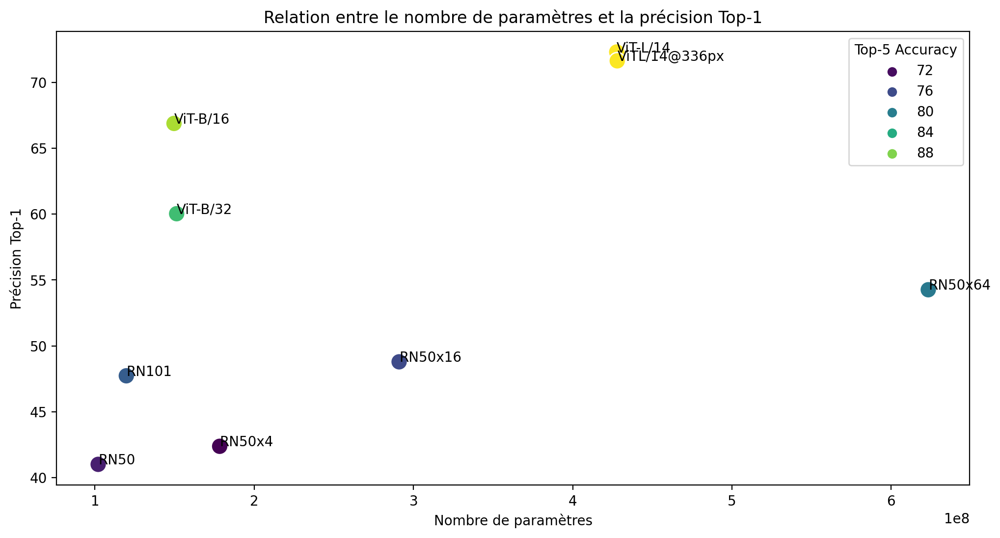

In [70]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

accuracy_data = [
    (41.01, 73.08, "RN50"),
    (47.73, 77.35, "RN101"),
    (42.38, 71.35, "RN50x4"),
    (48.79, 75.93, "RN50x16"),
    (54.26, 79.63, "RN50x64"),
    (60.03, 85.59, "ViT-B/32"),
    (66.88, 89.27, "ViT-B/16"),
    (72.3, 91.86, "ViT-L/14"),
    (71.63, 91.72, "ViTL/14@336px")
]

params_number_data = [
    102007137,
    119688033,
    178300601,
    290979217,
    623258305,
    151277313,
    149620737,
    427616513,
    427944193
]

df_accuracy = pd.DataFrame(accuracy_data, columns=["Top-1 Accuracy", "Top-5 Accuracy", "Model"])

df_accuracy["Parameters"] = params_number_data

plt.figure(figsize=(12, 6))
scatter = sns.scatterplot(data=df_accuracy, x="Parameters", y="Top-1 Accuracy", hue="Top-5 Accuracy", palette="viridis", s=150)
for line in range(0, df_accuracy.shape[0]):
     scatter.text(df_accuracy["Parameters"][line]+0.1, df_accuracy["Top-1 Accuracy"][line], df_accuracy["Model"][line], horizontalalignment='left', size='medium', color='black')
plt.xlabel("Nombre de paramètres")
plt.ylabel("Précision Top-1")
plt.title("Relation entre le nombre de paramètres et la précision Top-1")

plt.show()


In [ ]:
import torch
from tqdm import tqdm
import numpy as np
from sklearn.metrics import accuracy_score

def evaluate_models(models, preprocesses, loader, classnames, templates):
    results = []

    for model, preprocess in zip(models, preprocesses):
        zeroshot_weights = zeroshot_classifier(classnames, templates, model)
        top1_accuracy, top5_accuracy= evaluate_model(loader, model, zeroshot_weights)

        results.append({
            'Model': model.__class__.__name__,
            'Top-1 Accuracy': top1_accuracy,
            'Top-5 Accuracy': top5_accuracy
        })

    return results

# Use the function to evaluate and compare models
evaluation_results = evaluate_models(models, preprocesses, your_loader, your_classnames, your_templates)

# Display the results
df_results = pd.DataFrame(evaluation_results)
print(df_results)

# Plot the comparison
fig, ax = plt.subplots(figsize=(10, 6))

df_results.plot(x='Model', y=['Top-1 Accuracy', 'Top-5 Accuracy'], kind='bar', ax=ax, colormap='viridis')

ax.set_ylabel('Accuracy (%)')
ax.set_title('Model Comparison')

plt.show()
